# Project Title:
## Pneumonia Detection and Classification in Chest X-Ray Images using Machine Learning

### Importing Required Packages

In [1]:
# Library for numerical computing, especially for handling arrays
import numpy as np

# Library for data manipulation and analysis
import pandas as pd

# used to generate random numbers
import random

# plotting library used to create visualizations like graphs
import matplotlib.pyplot as plt

# library built on Matplotlib for creating more advanced and aesthetically pleasing statistical visualizations
import seaborn as sns

# Splits data into training and testing sets for model evaluation
from sklearn.model_selection import train_test_split

# measuring model performance, including accuracy, classification report, AUC-ROC curve, and confusion matrix
from sklearn.metrics import accuracy_score,classification_report,roc_auc_score,confusion_matrix,roc_curve,auc

# provides utilities for scaling and transforming data before modeling
from sklearn import preprocessing

# which allows interaction with the operating system, such as file and directory management
import os

# For image processing and computer vision tasks
import cv2

# IGNORING UNNECESSARRY WARNINGS
from warnings import filterwarnings
# These lines suppress specific non-critical warnings 
# (DeprecationWarning, FutureWarning, and UserWarning) to prevent them from appearing in the program's output.
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

### Loading Chest X-Ray Images Data Set
##### Source: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
##### About Dataset: 
##### The dataset consists of 5,863 chest X-ray images (JPEG format), organized into three main folders: train, test, and validation. Each folder contains subfolders representing two image categories: Pneumonia and Normal. These X-ray images were obtained from pediatric patients aged one to five years old at Guangzhou Women and Children’s Medical Center, Guangzhou. The chest X-rays were taken during routine clinical care in an anterior-posterior view.

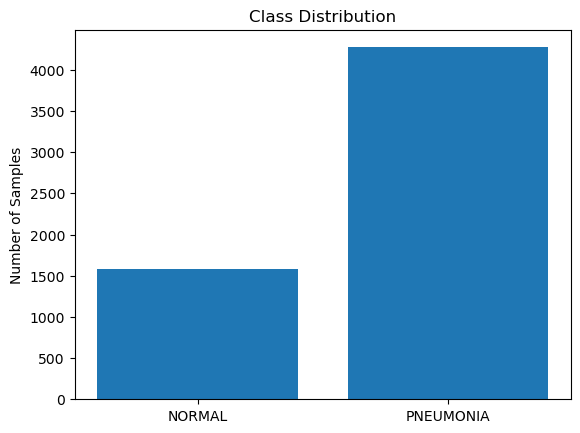

In [2]:
# Import and Shuffle the dataset
# Define class mapping
classes = {'NORMAL': 0, 'PNEUMONIA': 1}
folders = ['test', 'train', 'val']

# Data lists
data_x = []
data_y = []

# We will use this dataset for visualizing in test prediction
test_x = []
test_y = []

data = []

for folder in folders:
    for cls, cls_id in classes.items():  # Iterate over class items
        pth = os.path.join('chest_xray', folder, cls)  
        if not os.path.exists(pth):
            print(f"Path not found: {pth}")
            continue  # Skip if path doesn't exist
        
        for j in os.listdir(pth):
            img_path = os.path.join(pth, j)  
            img = cv2.imread(img_path, 0)  # Read the image in grayscale
            
            if img is None:
                print(f"Could not read image: {img_path}")
                continue  # Skip if image cannot be read

            img = cv2.resize(img, (200, 200))  # Resize the image
            data.append((img, cls_id))  # Append the image and its class ID

# Shuffle the data
random.shuffle(data)

# Define the class names
class_names = list(classes.keys())  # Extract class names

# Count the number of samples in each class
class_counts = {cls_id: 0 for cls_id in classes.values()}  # Initialize counts
for _, cls in data:
    if cls in class_counts:
        class_counts[cls] += 1
    else:
        class_counts[cls] = 1


# Plot the bar chart
plt.bar(class_names, class_counts.values())
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()

---
This code imports and processes a chest X-ray dataset by reading and resizing images, then labels them as either "NORMAL" or "PNEUMONIA." It shuffles the data and counts the number of samples in each class. Finally, it visualizes the class distribution using a bar chart.

---

### Balance the dataset
##### Why balancing the dataset is important ?
##### Balancing the dataset is important because an imbalanced dataset, where one class significantly outweighs the other, can lead to biased machine learning models. If a model is trained on an imbalanced dataset, it may become biased towards the majority class, leading to poor performance in detecting or classifying the minority class.

Balanced Class Distribution: {0: 4273, 1: 4273}


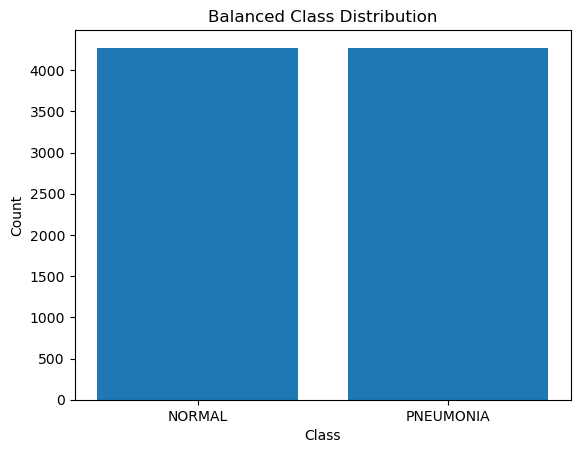

In [3]:
# Used to handle class imbalance by generating synthetic samples for the minority class
from imblearn.over_sampling import SMOTE

# Split the data into train and test sets
images, labels = zip(*data)

# Convert images and labels to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Flatten the image data
flattened_images = images.reshape(images.shape[0], -1)

# Create an instance of SMOTE
smote = SMOTE()

# Apply SMOTE to generate synthetic samples
oversampled_images, oversampled_labels = smote.fit_resample(flattened_images, labels)

# Reshape the flattened images back to the original shape
oversampled_images = oversampled_images.reshape(oversampled_images.shape[0], images.shape[1], images.shape[2])

# Check the balanced class distribution
unique, counts = np.unique(oversampled_labels, return_counts=True)
balanced_class_distribution = dict(zip(unique, counts))
print("Balanced Class Distribution:", balanced_class_distribution)

images = oversampled_images
labels = oversampled_labels
# Plot the balanced class distribution
plt.bar(class_names, balanced_class_distribution.values())
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Balanced Class Distribution')
plt.show()

---
This code uses SMOTE to address class imbalance in a dataset of chest X-ray images by generating synthetic samples for the minority class. It flattens the images for processing, applies SMOTE to create a balanced dataset, and reshapes the images back to their original format. Finally, it visualizes the balanced class distribution with a bar chart.

---

###  Data set size

In [4]:
data_images, test_images, data_labels, test_labels = train_test_split(images, labels, test_size=0.01, random_state=42)

# Append the shuffled data,test to the main lists
data_x.extend(data_images)
data_y.extend(data_labels)

test_x.extend(test_images)
test_y.extend(test_labels)
    

print('Data set size : ',len(data_x))
print('Test set size : ',len(test_x))

Data set size :  8460
Test set size :  86


---
This code splits the dataset of images and labels into training and testing sets, with 1% of the data reserved for testing. It appends the training data and labels to the existing lists `data_x` and `data_y`, and the testing data and labels to `test_x` and `test_y`. Finally, it prints the sizes of the updated training and testing datasets.

---

### Prepare data

In [11]:
data_x = np.array(data_x)
data_y = np.array(data_y)

data_x_updated = data_x.reshape(len(data_x), -1)
data_x_updated.shape

xtrain, xtest, ytrain, ytest = train_test_split(data_x_updated, data_y, random_state=10,
                                               test_size=.20)
xtrain.shape, xtest.shape

((6768, 40000), (1692, 40000))

---
The code converts `data_x` and `data_y` to NumPy arrays for efficient numerical operations. It reshapes `data_x` so each sample becomes a 1D vector while keeping the number of samples the same. Finally, it splits the data into training and test sets with an 80-20 ratio using `train_test_split`.

---

### Feature Scaling

In [12]:
# AS we can see, x_train & x_test are not scale
print(xtrain.max(), xtrain.min())

# Scaling the dataset
scaler = preprocessing.MinMaxScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

255 0


---
The code checks the maximum and minimum values of `xtrain` to show that it is not yet scaled. It initializes a `MinMaxScaler` from `sklearn.preprocessing` to scale the data between a specified range (default 0 to 1). It applies the scaler to both `xtrain` and `xtest`, transforming the features to the same scale for improved model performance.

---

# Drawing metrics function

In [13]:
def plot_metrics(ytest,pred):
    
    # Compute confusion matrix
    cm = confusion_matrix(ytest, pred)

    # Compute classification report
    report = classification_report(ytest, pred)
    #  report
    print('\n',report,'\n','_'*230,'\n\n')


    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(ytest, pred)
    roc_auc = auc(fpr, tpr)

    # Plot confusion matrix, classification report, and ROC curve
    plt.figure(figsize=(15, 5))

    # Plot confusion matrix
    plt.subplot(1, 2, 2)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix", {'fontsize': 20},y=1.3)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")

    # Plot ROC curve
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='b', label='ROC curve (AUC = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='r', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)', {'fontsize': 20},y=1.3)
    plt.legend(loc="lower right")

    plt.tight_layout()
    plt.show()

---
It computes the confusion matrix and classification report, which are printed for evaluating the model's performance (e.g., precision, recall, F1-score). It calculates the ROC curve and AUC (Area Under the Curve) to assess the model's ability to distinguish between classes.It visualizes the confusion matrix using a heatmap and the ROC curve, providing graphical insight into the model's performance.

---

# Showing testing proccess visually

In [14]:
def show_testing(test_x,test_y,method):
    fig, axes = plt.subplots(nrows=6,
                             ncols=5,
                             figsize=(20, 25),
                            subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):   
           img1 = test_x[i].reshape(1,-1)/255
           p = method.predict(img1)
           ax.imshow(test_x[i],cmap='gray')
           ax.set_title(f"PREDICTION:{class_names[p[0]]}\n Actual result:{class_names[test_y[i]]}")

---
It creates a grid of 6 rows and 5 columns (30 plots) using `plt.subplots`, with no ticks on the axes, to display the images. For each image in the test dataset, it reshapes and normalizes the image (`img1`), then uses the specified `method` (a trained model) to predict the class. It displays each test image in grayscale, adding a title showing the predicted and actual class labels (`class_names`).

---

# **Logistic Regression**

## Training

In [15]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

# Training the dataset
lg = LogisticRegression(C=0.1)
lg.fit(xtrain, ytrain)


# Prediction
pred = lg.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.96      0.86      0.91       859
           1       0.87      0.96      0.91       833

    accuracy                           0.91      1692
   macro avg       0.91      0.91      0.91      1692
weighted avg       0.91      0.91      0.91      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




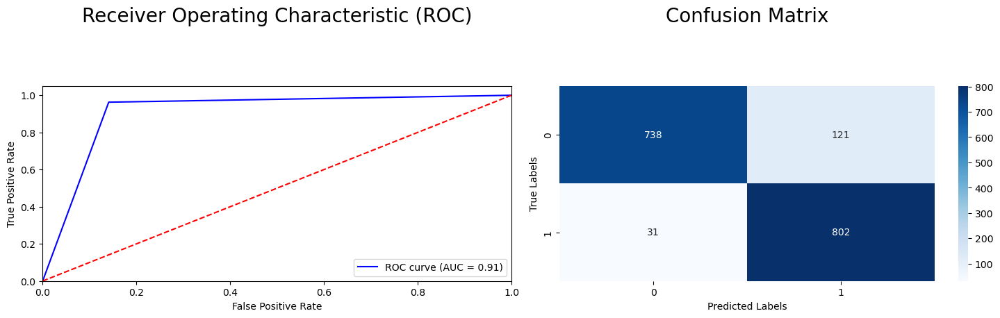

In [16]:
plot_metrics(ytest,pred)

## Visualize the proccess

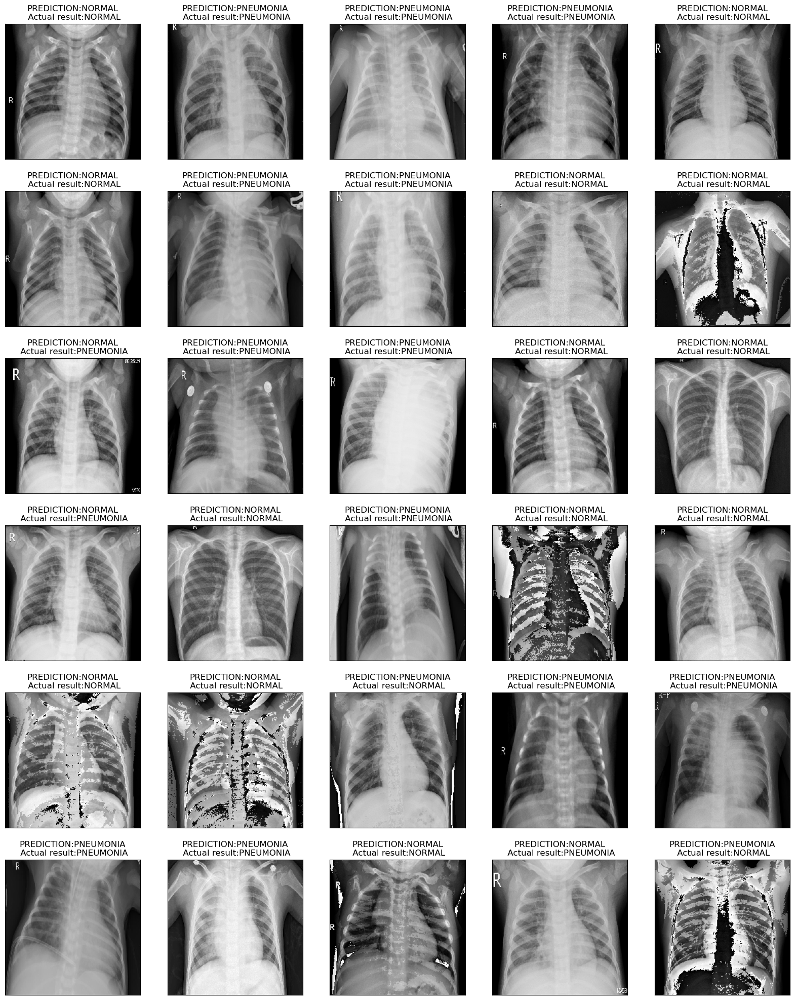

In [17]:
show_testing(test_x,test_y,lg)

# **SVC Model**

## Training and getting report

In [18]:
from sklearn.svm import SVC

# Training the dataset
sv = SVC()
sv.fit(xtrain, ytrain)

# Evaluation
print("Training Score:", sv.score(xtrain, ytrain))
print("Testing Score:", sv.score(xtest, ytest))

# Prediction
pred = sv.predict(xtest)

Training Score: 0.9747340425531915
Testing Score: 0.9609929078014184


## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.97      0.95      0.96       859
           1       0.95      0.97      0.96       833

    accuracy                           0.96      1692
   macro avg       0.96      0.96      0.96      1692
weighted avg       0.96      0.96      0.96      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




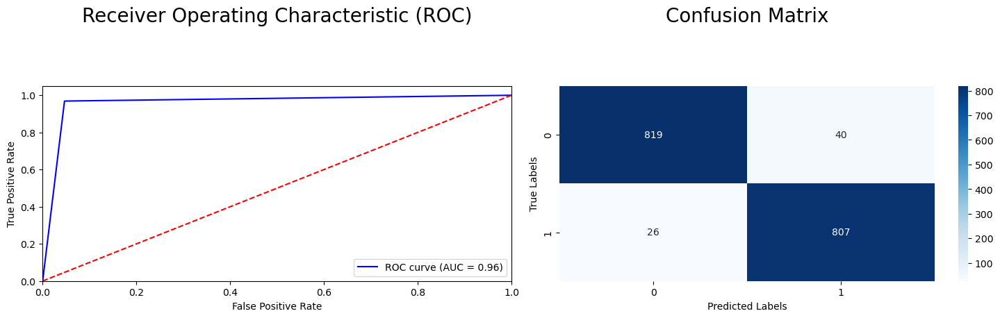

In [19]:
plot_metrics(ytest,pred)

## Visualize the proccess

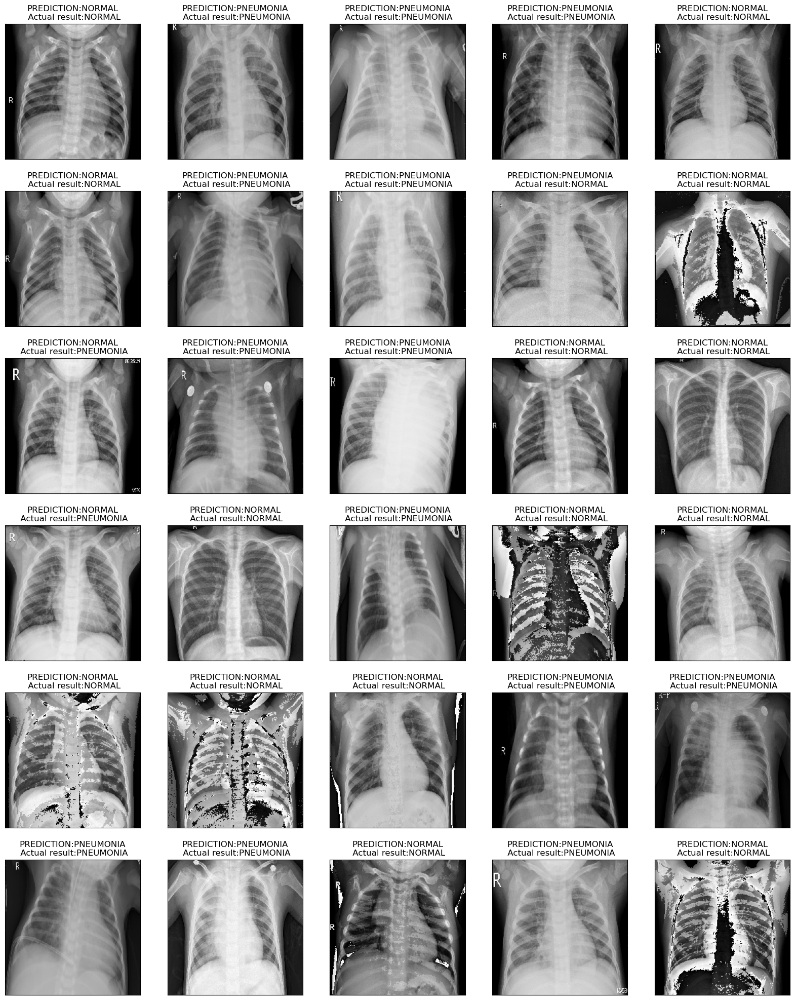

In [20]:
show_testing(test_x,test_y,sv)

# **kNN**

## Training

In [21]:
from sklearn.neighbors import KNeighborsClassifier

# train the dataset
knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(xtrain, ytrain)

# Prediction
pred = knn_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.96      0.55      0.70       859
           1       0.68      0.98      0.80       833

    accuracy                           0.76      1692
   macro avg       0.82      0.77      0.75      1692
weighted avg       0.82      0.76      0.75      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




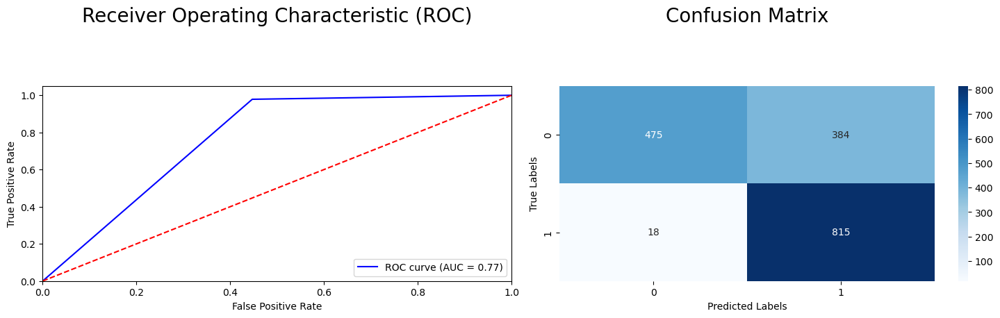

In [22]:
plot_metrics(ytest, pred)

## Visualize the proccess

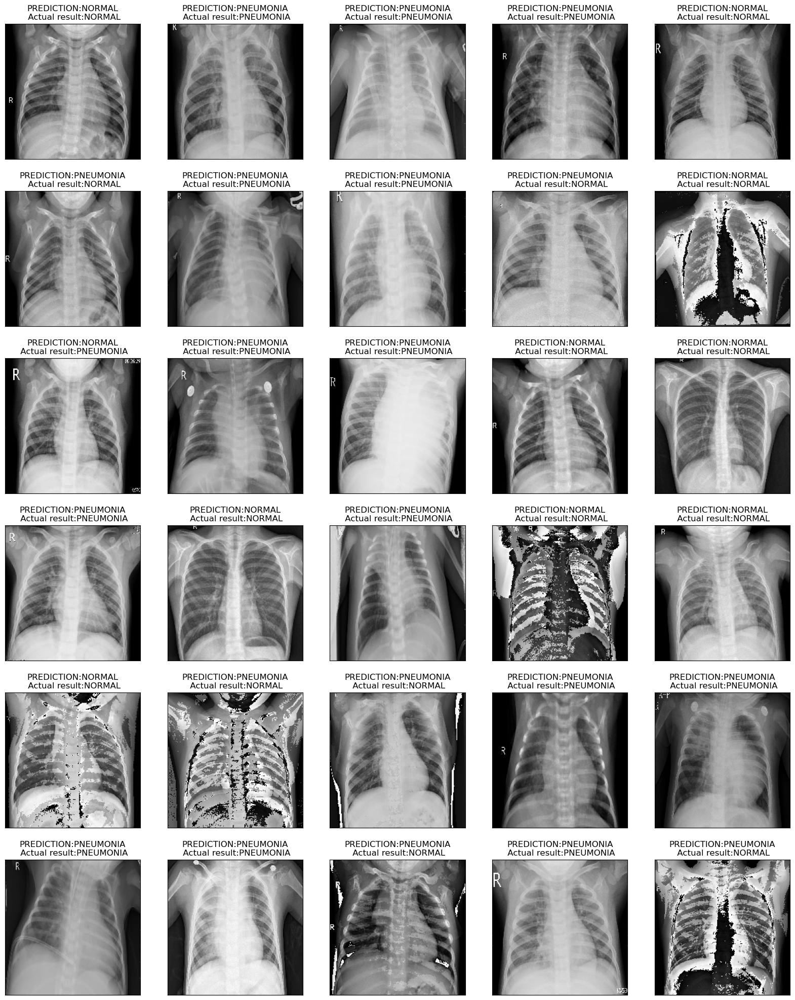

In [23]:
show_testing(test_x,test_y,knn_model)

# **Naive Bayes**

## Training and getting report

In [24]:
from sklearn.naive_bayes import GaussianNB

# train the dataset
nb_model = GaussianNB()
nb_model = nb_model.fit(xtrain, ytrain)


# Prediction
pred = nb_model.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.85      0.56      0.67       859
           1       0.66      0.89      0.76       833

    accuracy                           0.73      1692
   macro avg       0.75      0.73      0.72      1692
weighted avg       0.76      0.73      0.72      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




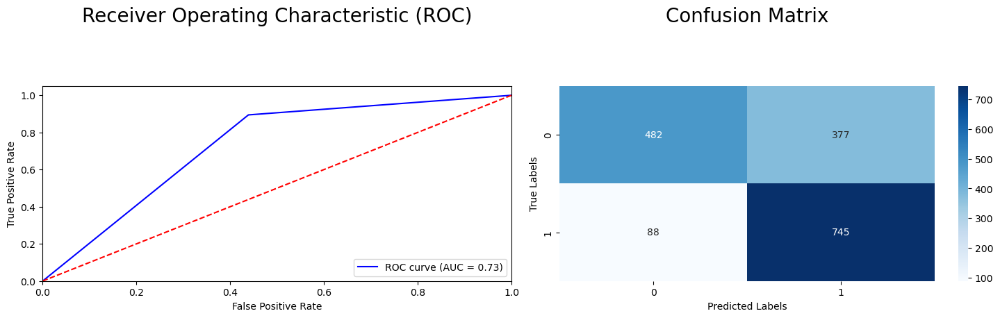

In [25]:
plot_metrics(ytest,pred)

## Visualize the proccess

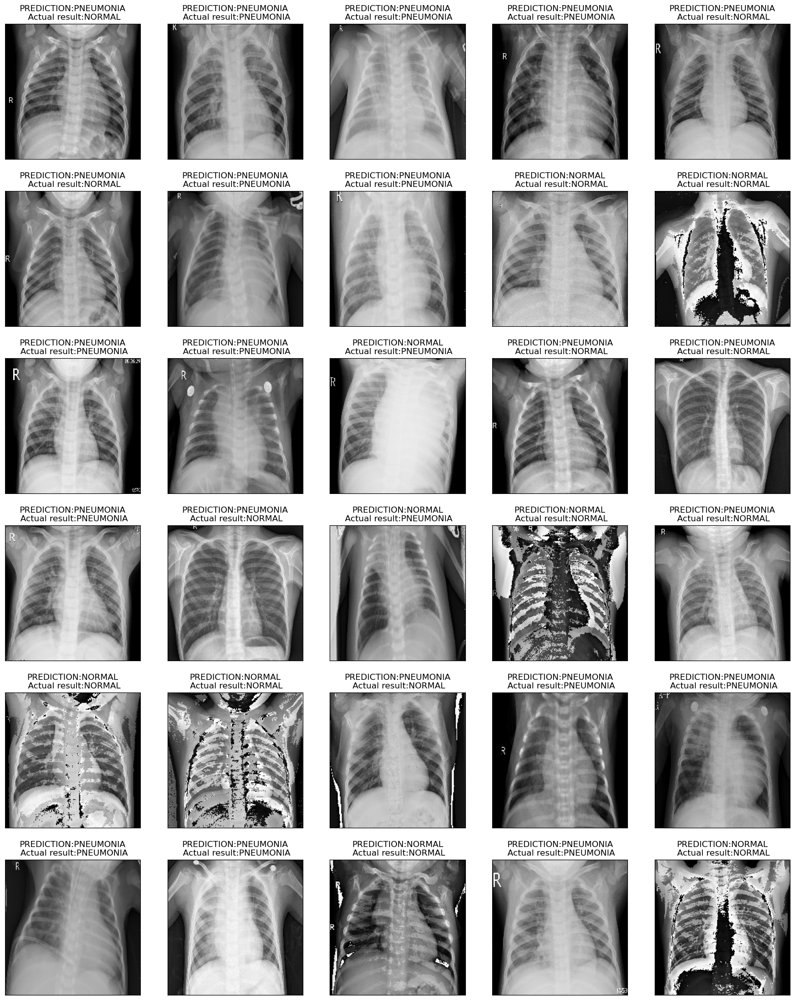

In [26]:
show_testing(test_x,test_y,nb_model)

# **Neural Networks**

## Plot function

In [27]:
def plot_history(history):
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))  # Create a figure with 1 row and 3 columns

    # Plot the first graph on the first axis (axs[0])
    axs[0].plot(history.history['loss'], label='loss')
    axs[0].plot(history.history['val_loss'], label='val_loss')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Binary crossentropy')
    axs[0].grid(True)

    # Plot the second graph on the second axis (axs[1])
    axs[1].plot(history.history['accuracy'], label='accuracy')
    axs[1].plot(history.history['val_accuracy'], label='val_accuracy')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy')
    axs[1].grid(True)

    # Plot the third graph on the third axis (axs[2])
    summary = pd.DataFrame(history.history)
    summary.plot(ax=axs[2])

    plt.tight_layout()  # Adjust the spacing between subplots

    plt.show()  # Display the figure

## Train function

In [28]:
import tensorflow as tf

def train_model(X_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs):
  nn_model = tf.keras.Sequential([
      tf.keras.layers.Dense(num_nodes, activation='relu', input_shape=(None,40000)),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(num_nodes, activation='relu'),
      tf.keras.layers.Dropout(dropout_prob),
      tf.keras.layers.Dense(1, activation='sigmoid')
  ])

  nn_model.compile(optimizer=tf.keras.optimizers.Adam(lr), loss='binary_crossentropy',
                  metrics=['accuracy'])
  history = nn_model.fit(
    X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0
  )

  return nn_model, history

## Finding best combination for least value loss by training

16 nodes, dropout 0, lr 0.01, batch size 32





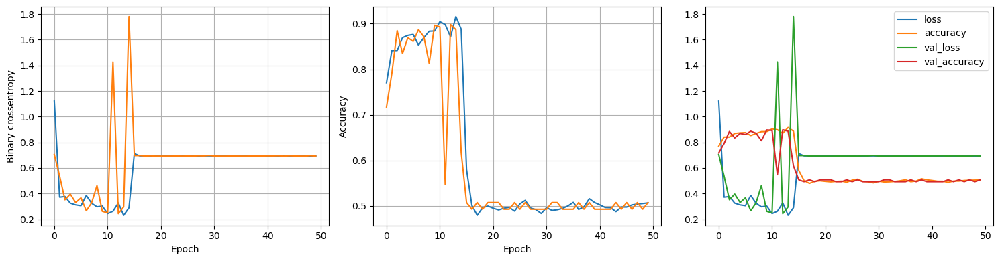

LOSS:  0.6931
ACCURACY:  0.51
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.01, batch size 64


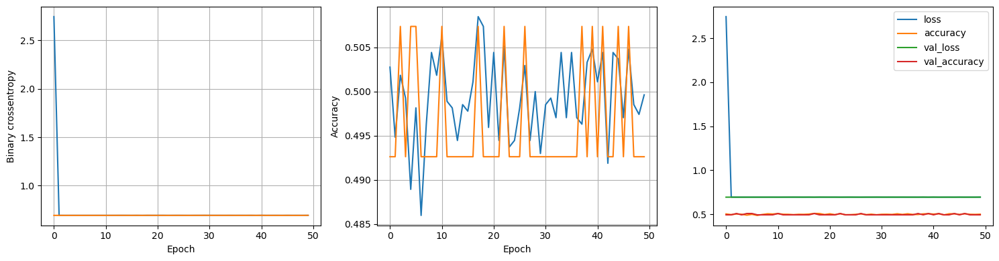

LOSS:  0.6940
ACCURACY:  0.49
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.01, batch size 128


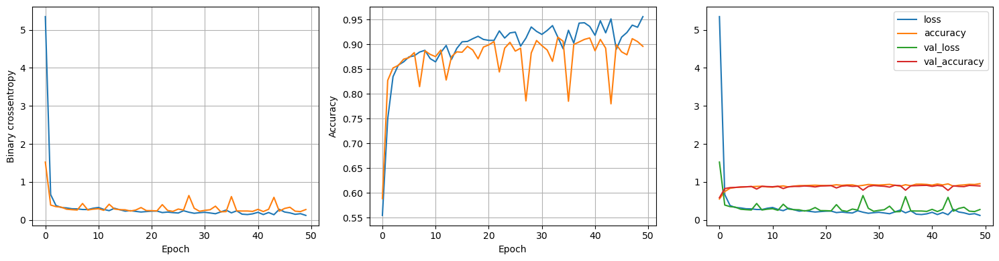

LOSS:  0.2475
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 32


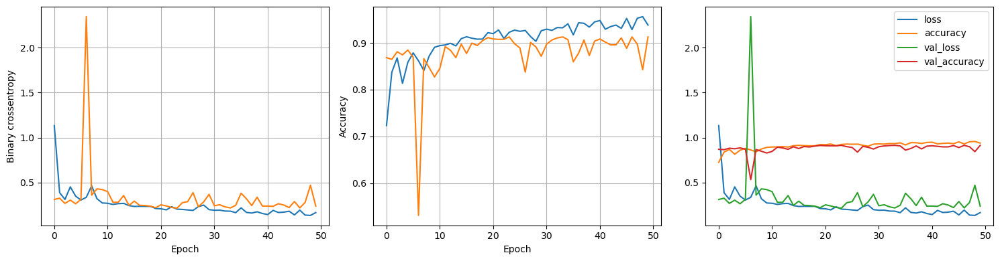

LOSS:  0.2092
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 64


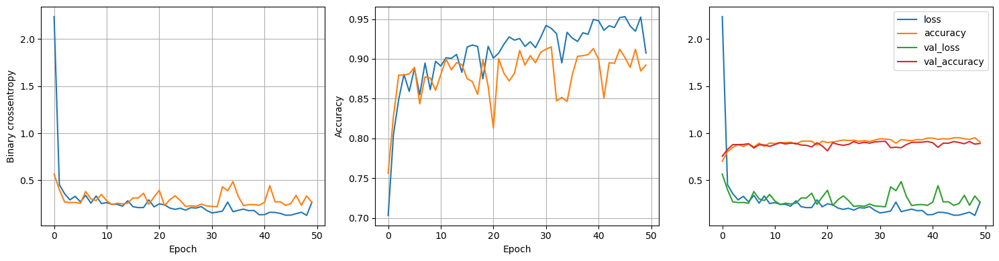

LOSS:  0.2500
ACCURACY:  0.90
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.005, batch size 128


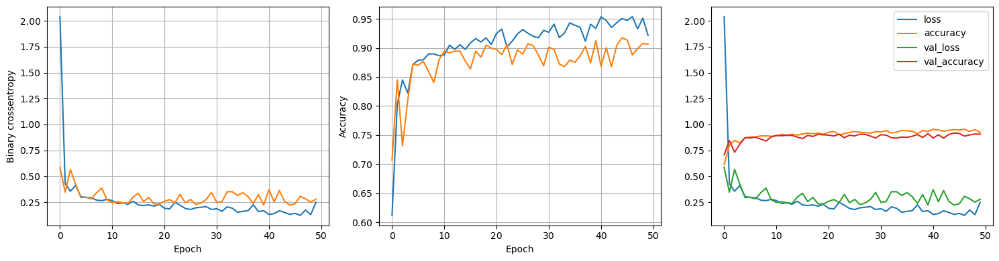

LOSS:  0.2587
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 32


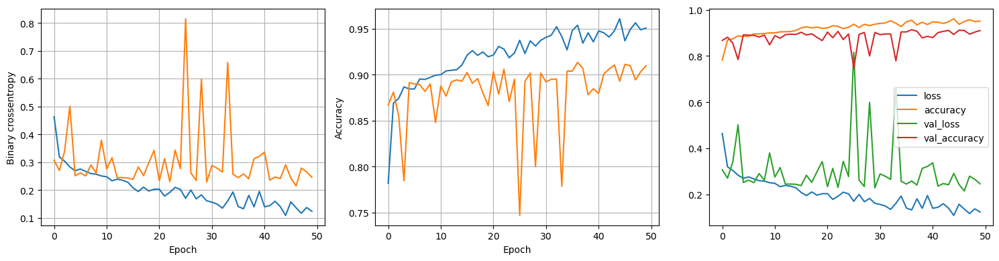

LOSS:  0.2208
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 64


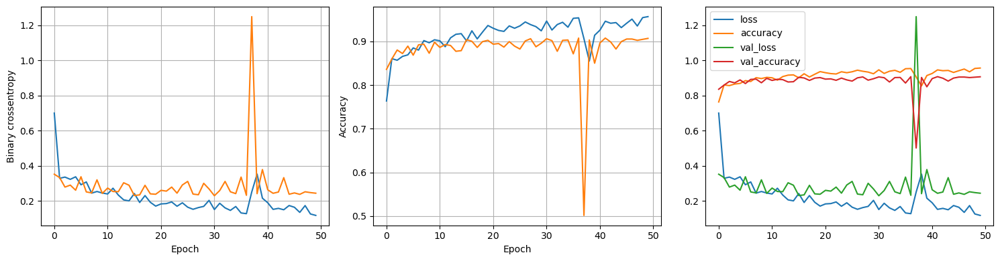

LOSS:  0.2191
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



16 nodes, dropout 0, lr 0.001, batch size 128


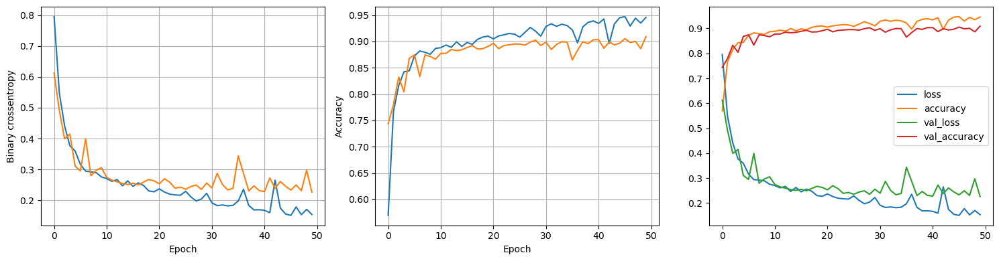

LOSS:  0.2029
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 32


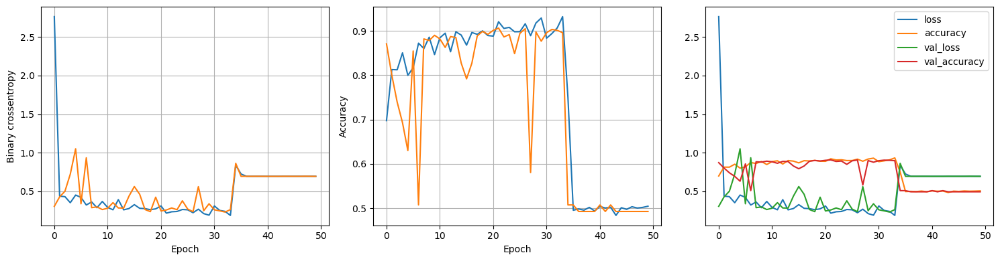

LOSS:  0.6932
ACCURACY:  0.49
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 64


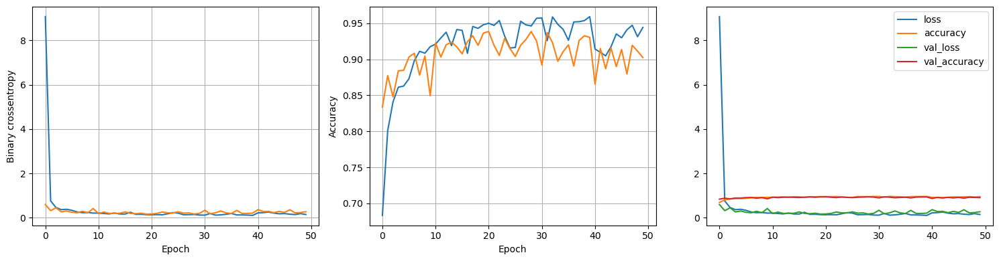

LOSS:  0.2471
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.01, batch size 128


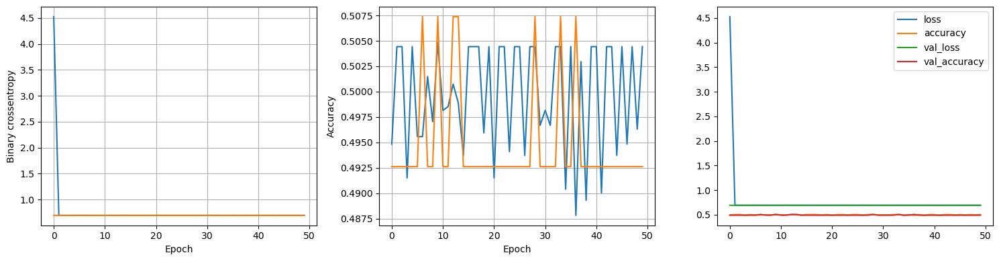

LOSS:  0.6933
ACCURACY:  0.49
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 32


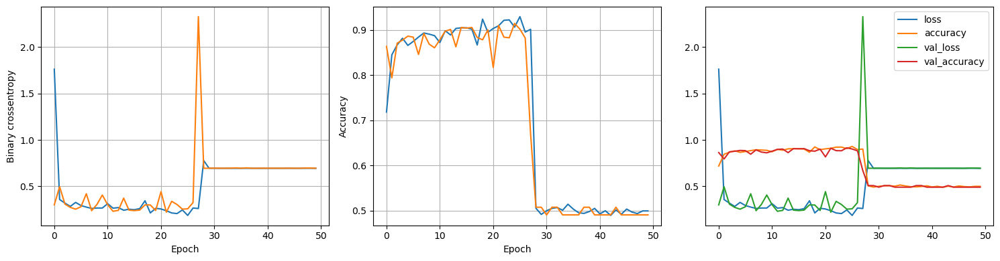

LOSS:  0.6936
ACCURACY:  0.49
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 64


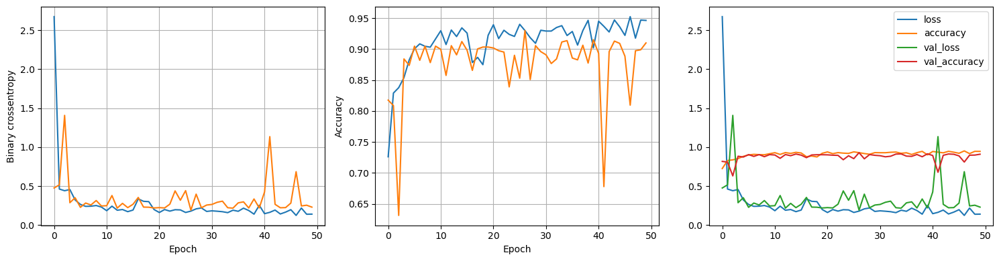

LOSS:  0.2082
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.005, batch size 128


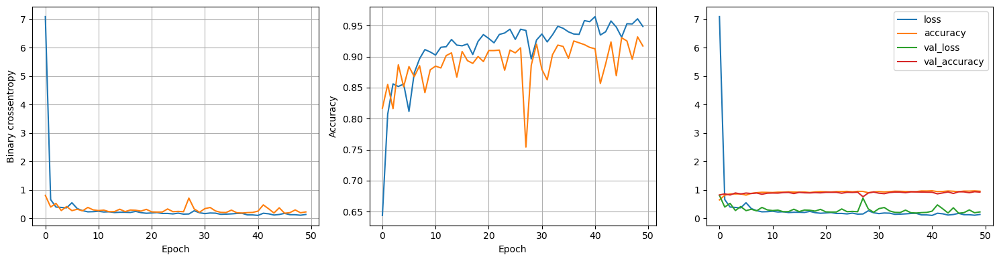

LOSS:  0.1886
ACCURACY:  0.93
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 32


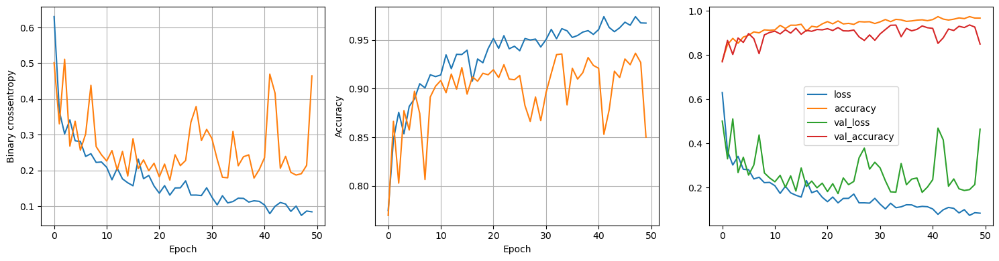

LOSS:  0.4644
ACCURACY:  0.84
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 64


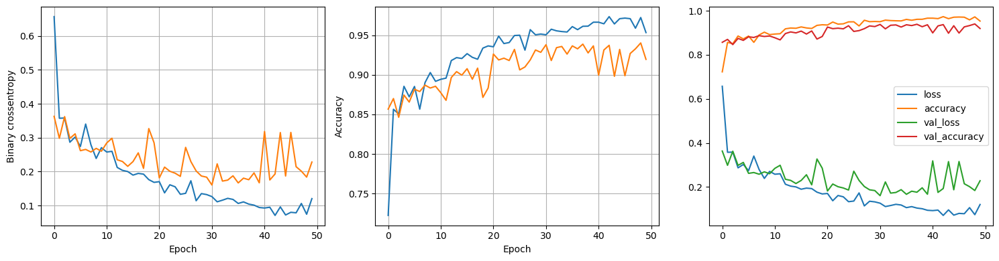

LOSS:  0.2123
ACCURACY:  0.93
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



32 nodes, dropout 0, lr 0.001, batch size 128


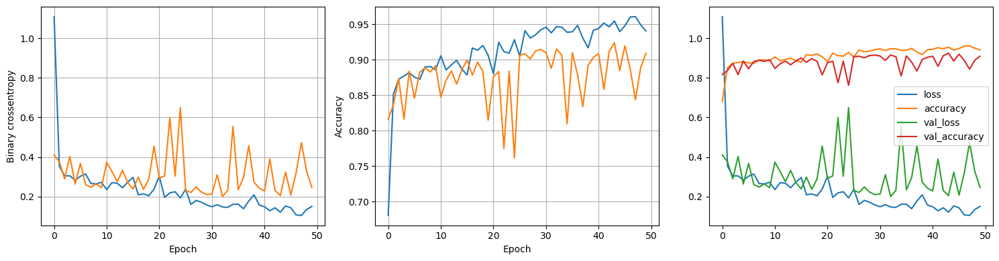

LOSS:  0.2159
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 32


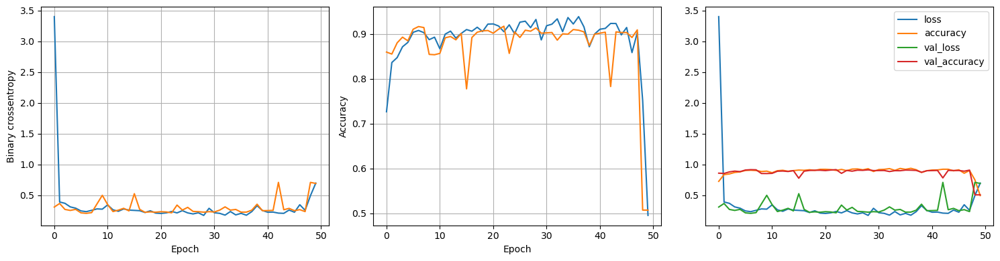

LOSS:  0.6930
ACCURACY:  0.51
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 64


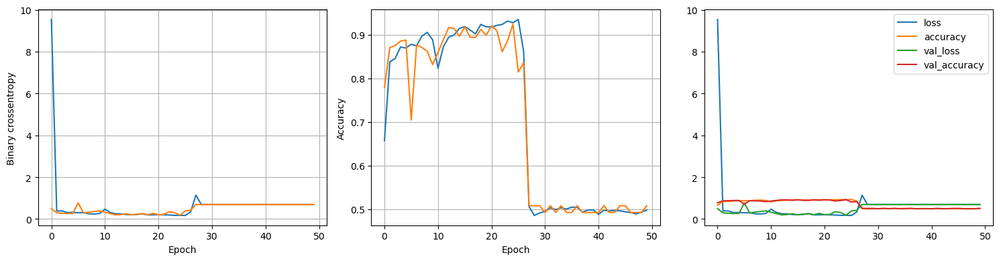

LOSS:  0.6933
ACCURACY:  0.51
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.01, batch size 128


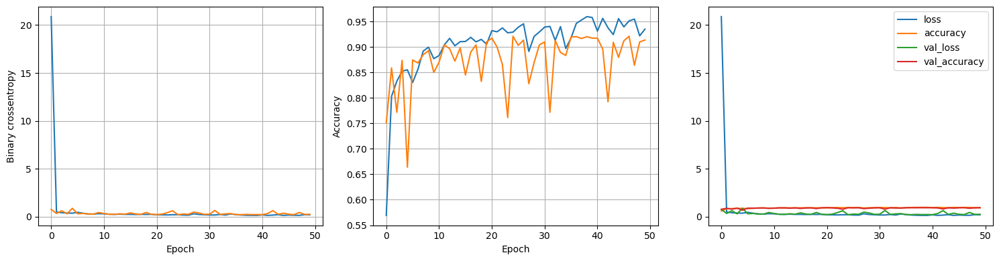

LOSS:  0.1994
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 32


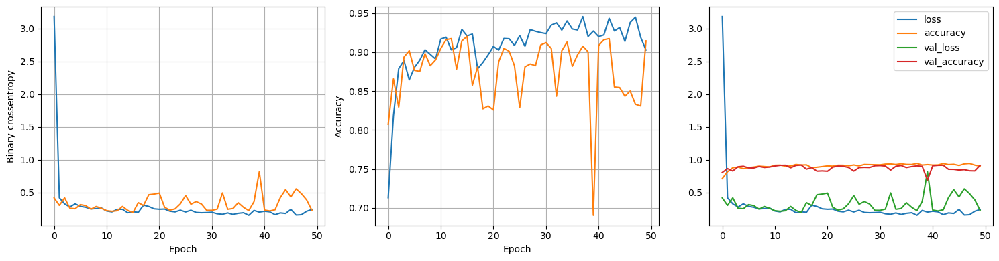

LOSS:  0.2108
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 64


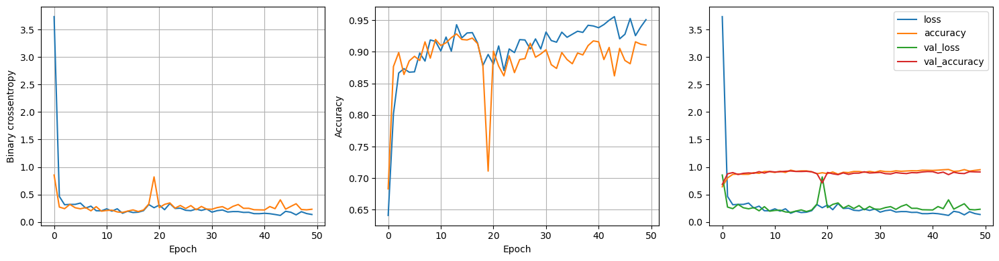

LOSS:  0.2080
ACCURACY:  0.92
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.005, batch size 128


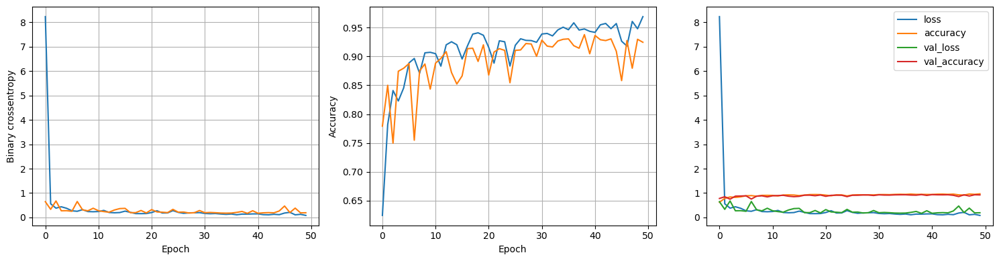

LOSS:  0.1742
ACCURACY:  0.93
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 32


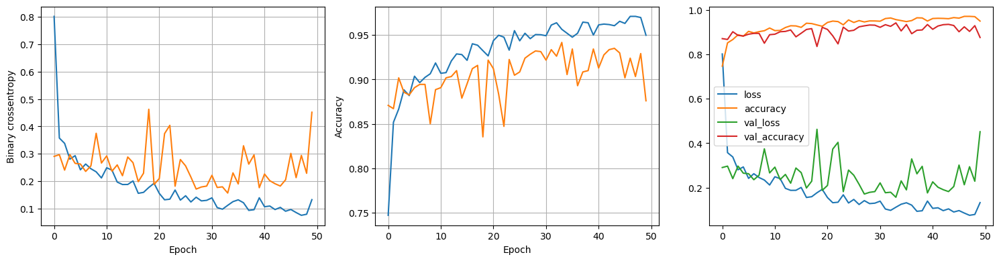

LOSS:  0.4387
ACCURACY:  0.85
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 64


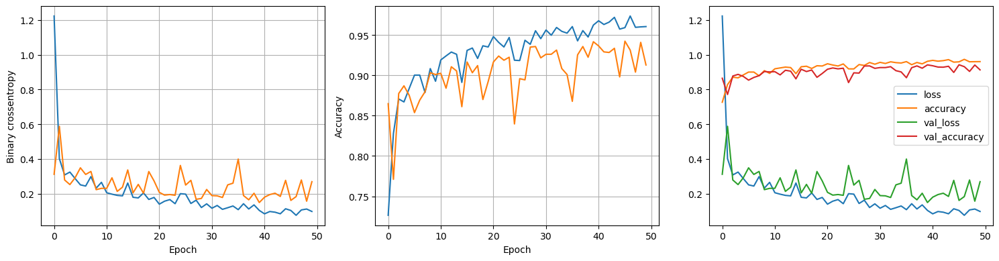

LOSS:  0.2446
ACCURACY:  0.91
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 



64 nodes, dropout 0, lr 0.001, batch size 128


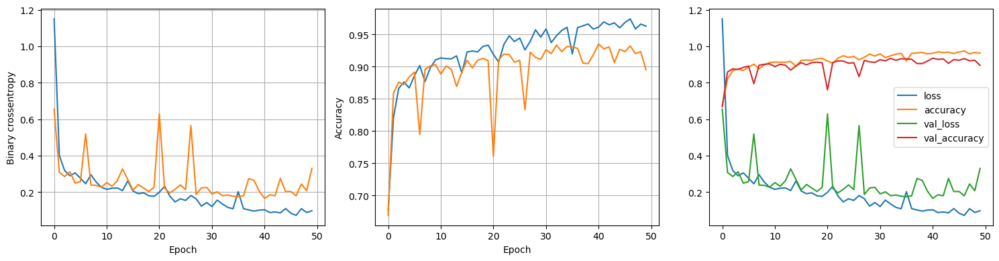

LOSS:  0.3053
ACCURACY:  0.89
______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 





In [29]:
least_val_loss = float('inf')
least_loss_model = None
epochs=50
dropout_prob = 0
for num_nodes in [16, 32, 64]:
    for lr in [0.01, 0.005, 0.001]:
      for batch_size in [32, 64, 128]:
        print(f"{num_nodes} nodes, dropout {dropout_prob}, lr {lr}, batch size {batch_size}")
        model, history = train_model(xtrain, ytrain, num_nodes, dropout_prob, lr, batch_size, epochs)
        plot_history(history)
       
        results = model.evaluate(xtest, ytest,verbose=0)
        print("LOSS:  " + "%.4f" % results[0])
        print("ACCURACY:  " + "%.2f" % results[1])
        val_loss = results[0]
        print("_"*230,'\n\n\n')
        if val_loss < least_val_loss:
          least_val_loss = val_loss
          least_loss_model = model

In [30]:
Model_Results = least_loss_model.evaluate(xtest,ytest)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

53/53 [==============================] - 0s 6ms/step - loss: 0.1742 - accuracy: 0.9320
LOSS:  0.1742
ACCURACY:  0.93


## Confusion matrix , Classification Report , ROC Curves

53/53 [==============================] - 0s 6ms/step

               precision    recall  f1-score   support

           0       0.91      0.96      0.93       859
           1       0.96      0.90      0.93       833

    accuracy                           0.93      1692
   macro avg       0.93      0.93      0.93      1692
weighted avg       0.93      0.93      0.93      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




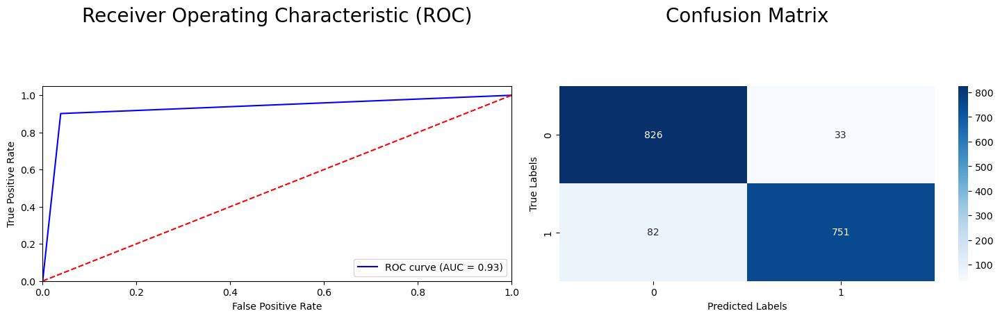

In [31]:
y_pred = least_loss_model.predict(xtest)
y_pred = (y_pred > 0.5).astype(int).reshape(-1,)
plot_metrics(ytest, y_pred)

## Visualize the proccess

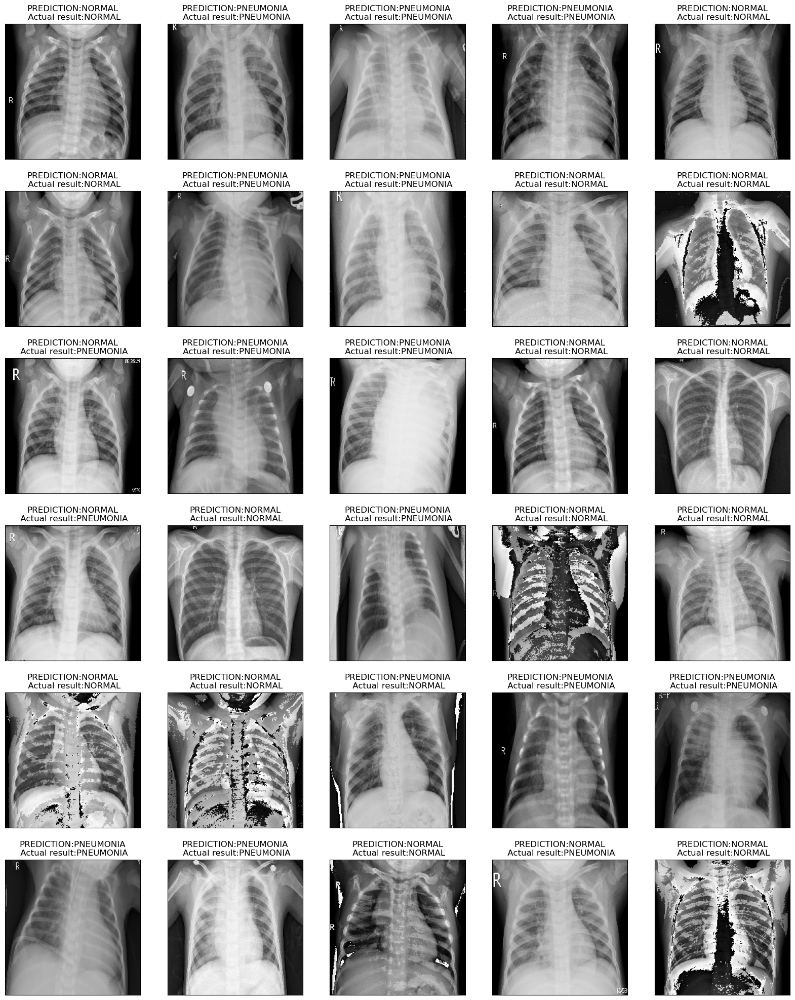

In [32]:
fig, axes = plt.subplots(nrows=6,
                         ncols=5,
                         figsize=(20, 25),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):   
       img = test_x[i].reshape(1,-1)/255
       p = (least_loss_model.predict(img,verbose = 0)> 0.5).astype(int)
       ax.imshow(test_x[i],cmap='gray')
       ax.set_title(f"PREDICTION:{class_names[p[0][0]]}\n Actual result:{class_names[test_y[i]]}")

# **Random Forest**

## Training

In [33]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(xtrain, ytrain)

y_pred = rf.predict(xtest)

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.94      0.96      0.95       859
           1       0.96      0.94      0.95       833

    accuracy                           0.95      1692
   macro avg       0.95      0.95      0.95      1692
weighted avg       0.95      0.95      0.95      1692
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




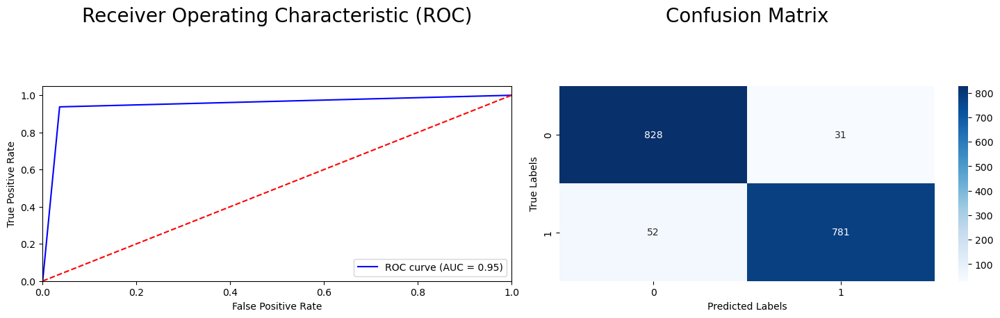

In [34]:
plot_metrics(ytest,y_pred)

## Visualize the proccess

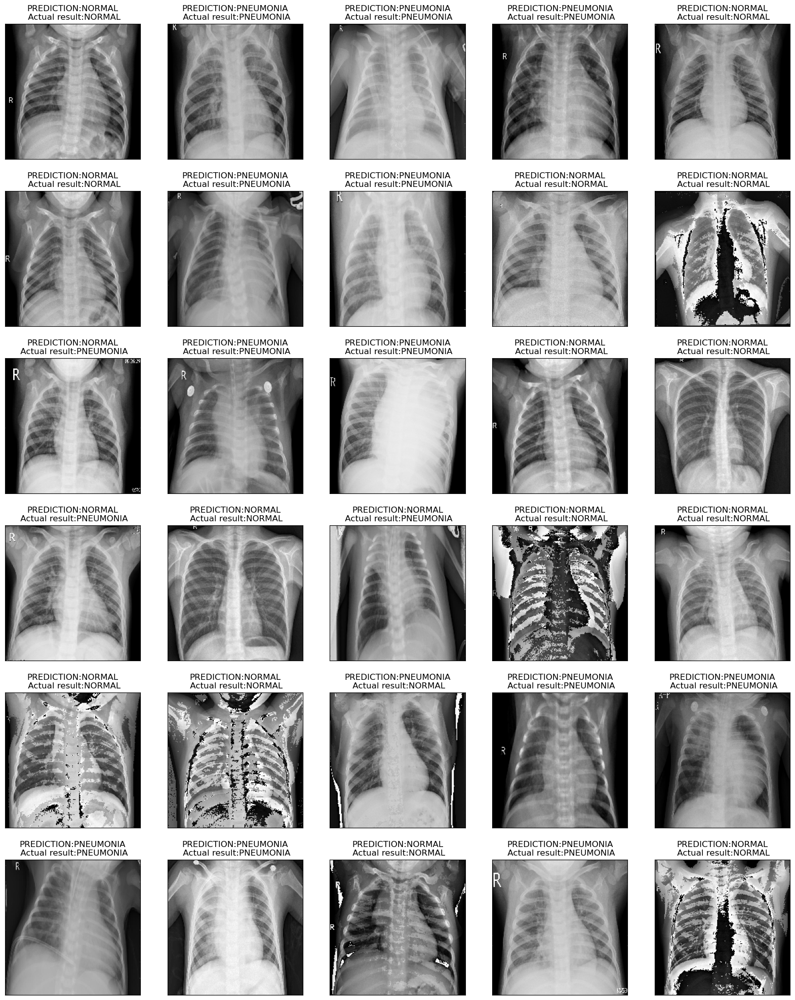

In [35]:
show_testing(test_x,test_y,rf)

# **K-means clustering**

## Training

In [36]:
from sklearn.cluster import KMeans


# Scaling the dataset (but here we use all the dataset not only train)
scaler = preprocessing.MinMaxScaler()
data_x = scaler.fit_transform(data_x_updated)

k = 2  # Number of clusters (normal and tumor)
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(data_x)

y_pred = kmeans.labels_

## Confusion matrix , Classification Report , ROC Curves


               precision    recall  f1-score   support

           0       0.54      0.48      0.51      4229
           1       0.53      0.59      0.56      4231

    accuracy                           0.54      8460
   macro avg       0.54      0.54      0.53      8460
weighted avg       0.54      0.54      0.53      8460
 
 ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 




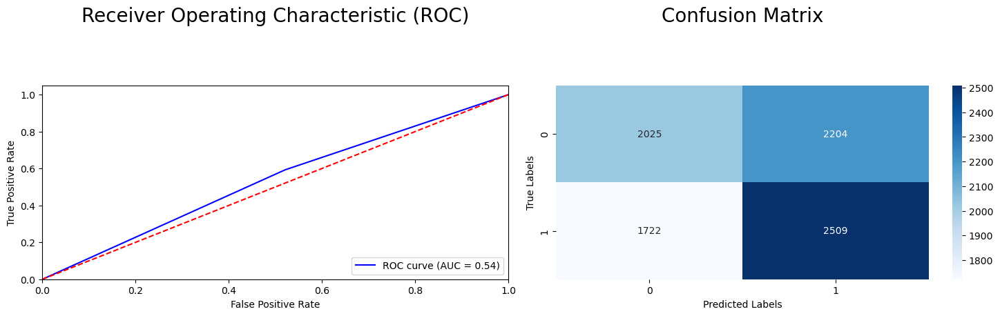

In [37]:
plot_metrics(data_y,y_pred)